# Introduction
The primary objective is to leverage the capabilities of Generative Adversarial Networks, specifically focusing on CycleGANs, to create art in the style of Monet. This task involves developing a deep learning model capable of translating pictures to the style of Monet.  The challenge lies in capturing the Monet's artistic style and applying it to a diverse set of images to generate convincing art pieces.

This could be considered an Img2Img picture.

The dataset is a few hundred paintings from Monet, and a few thousand photographs which need to be translated.  The goal is to generate converted Monet paintings from the images.. 

# Exploratory Data Analysis
To start, we will load the data.  While the tfrec format is suggested, I am going to use JPGs due to my familiarity with them.  Let's start by simply observing the data.
We will import our needed directories for the project, and then start defining some utility functions to load images, as well as use them.

In [20]:
import tensorflow as tf
import os
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras import layers, models, Input
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

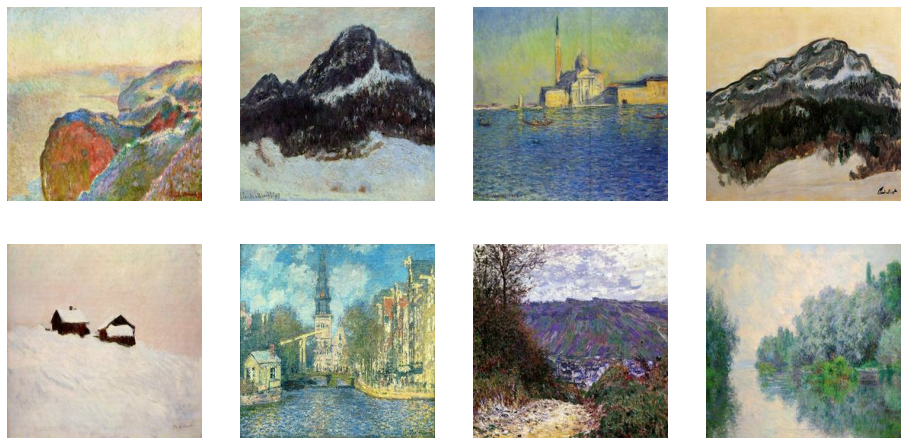

In [2]:
image_dir = 'gan-getting-started/monet_jpg'

# Function to load a single image
def load_and_preprocess_image(path):
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)  # This Decodes the JPEG
    return image

# Show image
def show(images, cols=4):
    rows = (len(images) + cols - 1) // cols  # Calculate the required number of rows
    plt.figure(figsize=(cols * 4, rows * 4))  # Adjust figure size based on cols
    for i, image in enumerate(images):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(image)
        plt.axis('off')
    plt.show()

list_ds = tf.data.Dataset.list_files(os.path.join(image_dir, '*.jpg'))
image_ds = list_ds.map(load_and_preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)

images_to_show = [image.numpy() for image in image_ds.take(8)]
show(images_to_show, cols=4)

As we can see, these are some examples of real Monet paintings.  Lets go ahead and begin with some analysis.

## Color Histogram
We will start by analyzing the colors of the images via a histogram.  We will observe a few images.

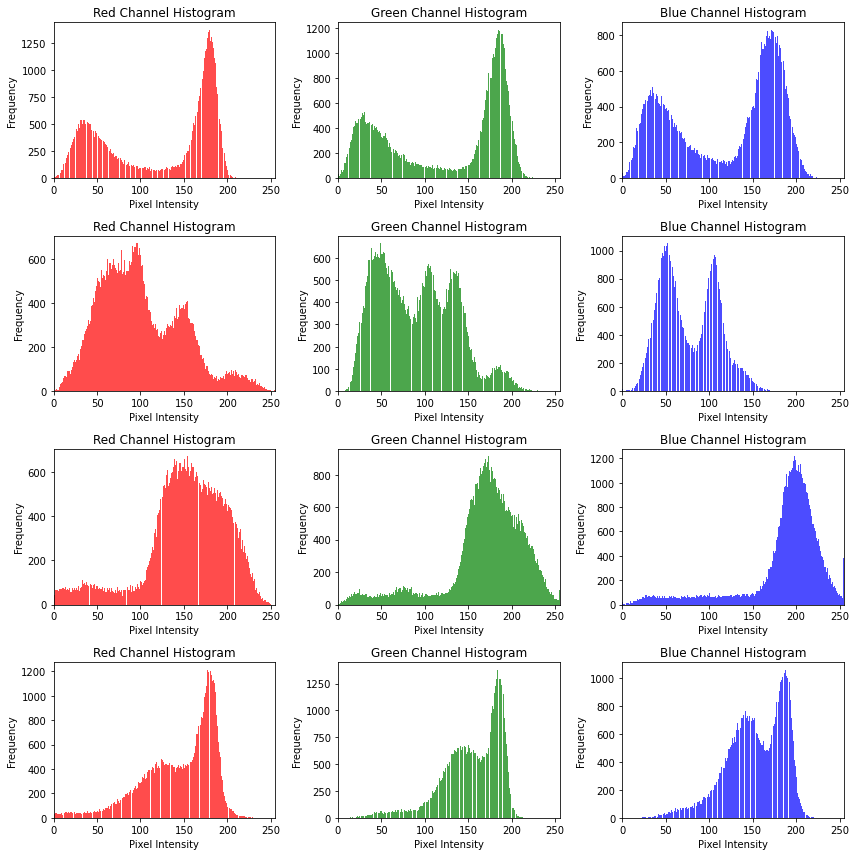

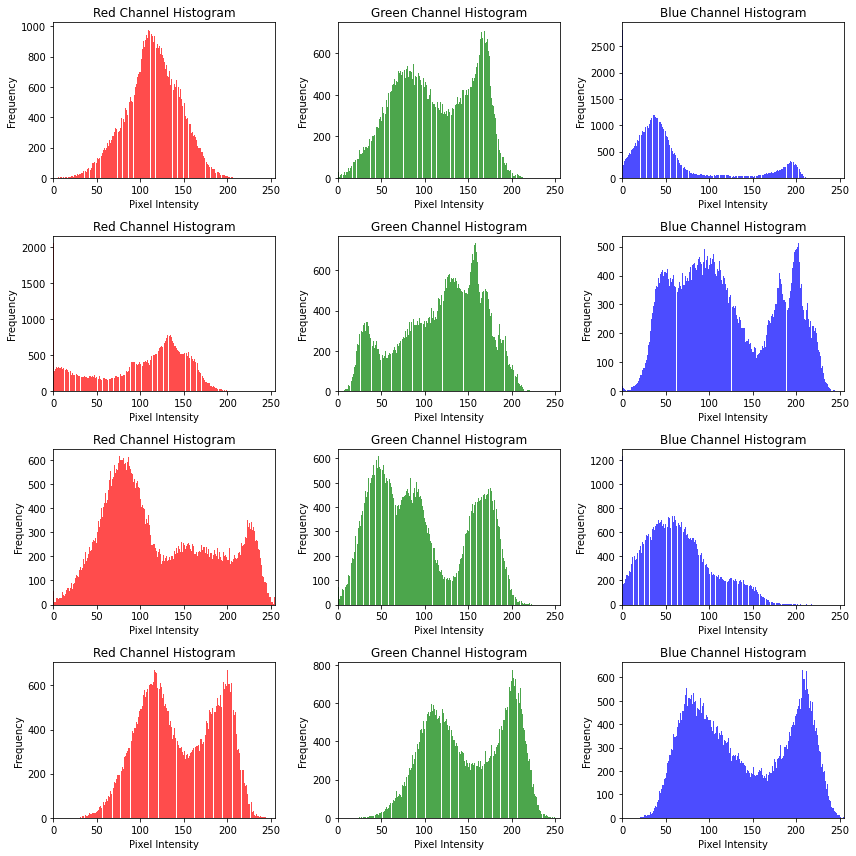

In [8]:
def plot_color_histograms(images):    
    if not isinstance(images, np.ndarray):
        images = images.numpy()
    
    num_images = len(images)
    fig, axs = plt.subplots(num_images, 3, figsize=(12, num_images * 3))
    
    if num_images == 1:
        axs = np.expand_dims(axs, 0)
    
    for i, img in enumerate(images):
        for j, color in enumerate(['Red', 'Green', 'Blue']):
            channel_data = img[:, :, j].flatten()
            axs[i, j].hist(channel_data, bins=256, color=color.lower(), alpha=0.7)
            axs[i, j].set_xlim([0, 255])
            axs[i, j].set_title(f'{color} Channel Histogram')
            axs[i, j].set_xlabel('Pixel Intensity')
            axs[i, j].set_ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()

# we will do 2 batches of 4.
for images in image_ds.batch(4).take(2):
    plot_color_histograms(images)

From this, we can see there seem to be two trends.  One is a "single spike" intensity image, and the other is a "dual spike".  Additionally, there appears to be a good balance of colors in most, but not all images.

## Fourier Transform Analysis
This is an interesting analysis.  We will apply the fourier transform to some of the paintings to observe the underlying frequencies.  This can help us expose hidden trends, which the model may or may not be able to use.

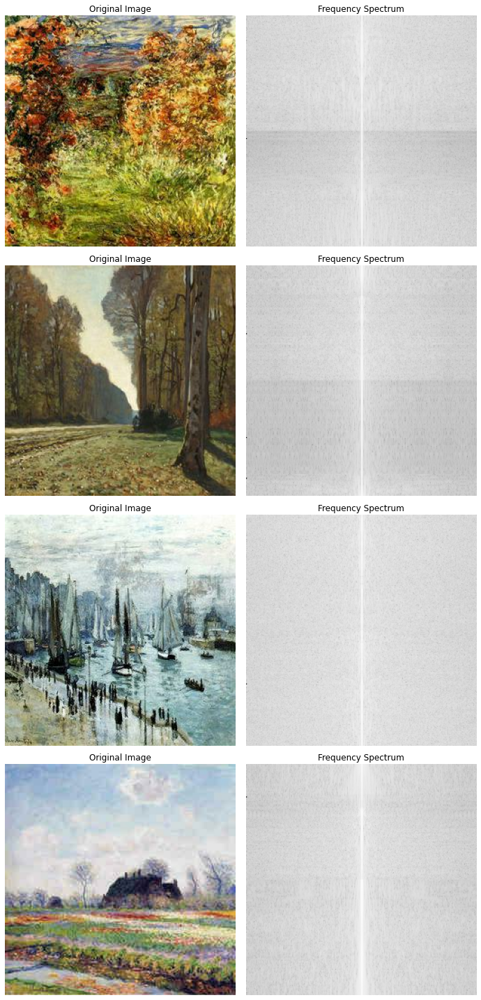

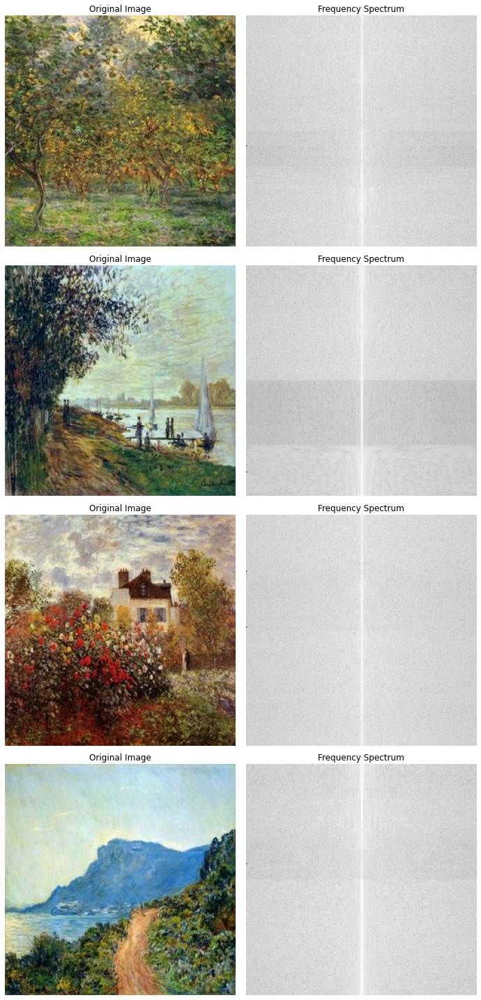

In [11]:
def plot_frequency_transform(images):
    # Convert images to grayscale to simplify the Fourier Transform computation
    images_gray = tf.image.rgb_to_grayscale(images)

    # Now apply the transform
    fft_images = tf.signal.fft2d(tf.cast(images_gray, tf.complex64))
    
    # Shift the zero frequency component to the center to get better image
    fft_shift = tf.signal.fftshift(fft_images)
    
    magnitude_spectrum = tf.math.log(tf.abs(fft_shift) + 1e-10)  # Add a small value to avoid log(0), just in case
    
    num_images = len(images)
    fig, axs = plt.subplots(num_images, 2, figsize=(10, num_images * 5))
    
    for i in range(num_images):
        axs[i, 0].imshow(images[i])
        axs[i, 0].set_title('Original Image')
        axs[i, 0].axis('off')
        
        # Plot of the magnitude
        axs[i, 1].imshow(magnitude_spectrum[i, ..., 0], cmap='gray')
        axs[i, 1].set_title('Frequency Spectrum')
        axs[i, 1].axis('off')
    
    plt.tight_layout()
    plt.show()

for images in image_ds.batch(4).take(2):
    plot_frequency_transform(images)

### Interpretting these results
While this may look like junk at first, there is actually valuable data here.  For one, thre are often sharp contrats between the foreground and background.  This means that there may be differences in things like brush strokes between the foreground and background in these paintings.  Also, the "textured" look of the spectrum implies lots of noise, which is very apparent in Monet's paintings, even visually.

### An Important Conclusion
Filtering should NOT be part of preprocessing.  It would get rid of noise, which is an important part of Monet's paintings.  Some of this noise may be artifacts of the images being low resolution, but for the most part these are meaningful parts of Monet's style. 

## Finding Outliers
Monet has many paintings, and many fall in line with each other.  However, some are outliers as we will see below.  These may be good to remove so that the model trains on the general Monet painting, instead of getting confused by outliers.  Lets have a look.
Doing this will require that we use a CNN (ResNet50, a pretrained model) to help idenfity features of the images.
We will then use PCA to breakdown the extracted features

In [15]:
# Load the pre-trained ResNet50 model
base_model = ResNet50(weights='imagenet')
model = Model(inputs=base_model.input, outputs=base_model.get_layer('avg_pool').output)

def extract_features(img_paths, model):
    features = []
    for img_path in img_paths:
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        expanded_img_array = np.expand_dims(img_array, axis=0)
        preprocessed_img = preprocess_input(expanded_img_array)
        features.append(model.predict(preprocessed_img)[0])
    return np.array(features)

img_paths = [f'gan-getting-started/monet_jpg/{file}' for file in os.listdir('gan-getting-started/monet_jpg')]
features = extract_features(img_paths, model)

1/1 [==============================] - 0s 67ms/step


This takes a while to run, but we get our features out of this.  To analyze the features, lets run it through PCA and t-SNE.  Then, we will visualize. 

In [17]:
# Math
# PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(features)

# t-SNE
tsne = TSNE(n_components=2, perplexity=30.0)
tsne_result = tsne.fit_transform(features)

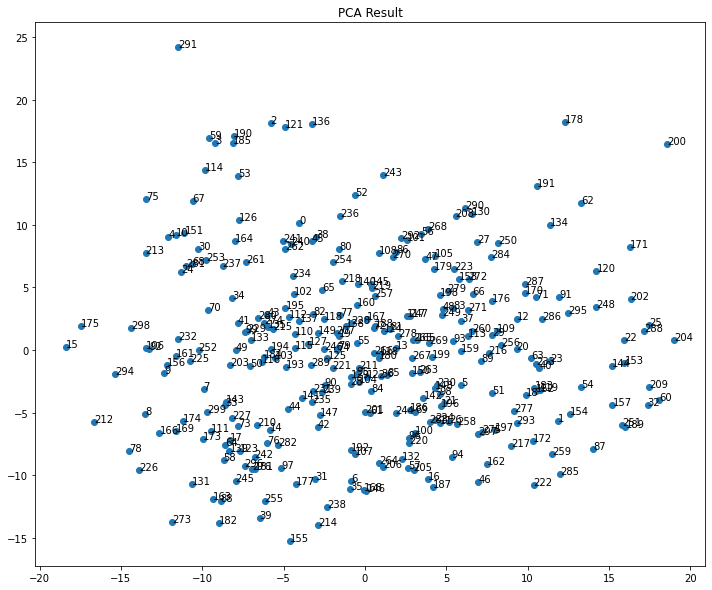

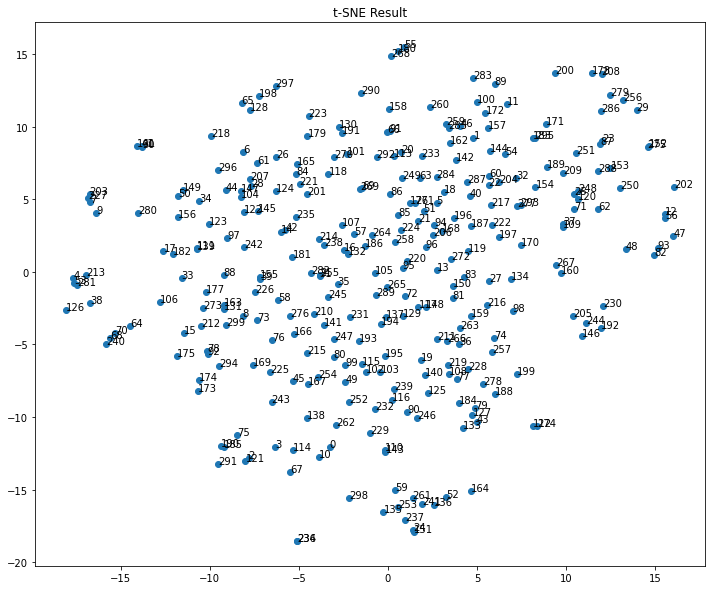

In [18]:
# Visualize
def plot_embedding(result, img_paths, title='PCA result'):
    plt.figure(figsize=(12, 10))
    plt.scatter(result[:, 0], result[:, 1])
    plt.title(title)
    for i, img_path in enumerate(img_paths):
        plt.text(result[i, 0], result[i, 1], str(i))  # Annotate some points with their index or any identifier
    plt.show()

plot_embedding(pca_result, img_paths, 'PCA Result')
plot_embedding(tsne_result, img_paths, 't-SNE Result')

### Understanding these plots
These plots show variation via PCA and t-SNE, so we can try and spot outliers.  Unfortunately, there is a decent spread with not many obvious outliers.
A few in the PCA result, however, are:
- 291
- 200
- 178

Depending on how tight of a spread we wanted, we could eliminate some larger patches, but against my expectation, I don't think there is actually much value in removing paintings.

## Applying Preprocessing
There is not much I can think of to do in terms of preprocessing since our images are all the same size.  From what I've learned, it seems like normalizing images is generally helpful, so we will do that.

As I noted earlier, filtering seems like it will remove important qualities from the Monet style, so we will forego that.  

In [19]:
import tensorflow as tf

def normalize_image(image):
    """Normalize images to [-1, 1]"""
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1  # Normalize image to [-1, 1]
    return image

image_ds = list_ds.map(load_and_preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
normalized_image_ds = image_ds.map(normalize_image, num_parallel_calls=tf.data.AUTOTUNE)

Now we are ready to focus on model architecture.

# Model Architecture
As mentioned, we were planning on doing a CycleGAN.  CycleGANs have two components - a discriminator and a generator.  The discriminator must be trained first to be able to tell a Monet image from a non-monet image.  Then we can use the generator to submit images to the discriminator for feedback on it's monet images.

After reading more, I am actually pivoting to a DCGAN.  A DCGAN can generate novel Monet style images without using the reference photos.  I think this will be really cool to see completely novel paintings, so we will be doing this instead.  I think it may also result in a higher scoring model.

## Defining the Discriminator
We will use a Convolutional Neural Network for this.  It is pretty straightforward.  It has one dropout layer at the end.

We will train it later.

In [22]:
def build_discriminator(input_shape=(256, 256, 3)):
    model = models.Sequential(name='discriminator')

    # First convolutional layer
    model.add(layers.Conv2D(64, kernel_size=4, strides=2, padding='same', input_shape=input_shape))
    model.add(layers.LeakyReLU(alpha=0.2))

    # Second convolutional layer
    model.add(layers.Conv2D(128, kernel_size=4, strides=2, padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Third convolutional layer
    model.add(layers.Conv2D(256, kernel_size=4, strides=2, padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Fourth convolutional layer
    model.add(layers.Conv2D(512, kernel_size=4, strides=2, padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Flattening and final dense layer
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.4))  # Dropout layer to reduce overfitting
    model.add(layers.Dense(1, activation='sigmoid'))  # Sigmoid activation to classify as real or fake (1 or 0)

    return model

## Defining the Generator
The generator will also be a convolutional network.  It will start with 16x16 and then scale up with each layer to double the resolution.  This is a "gradual" upscaling approach.

The last layer will output to 256x256.

In [23]:
def build_generator(z_dim=100):
    model = models.Sequential(name='generator')

    # Initial Dense layer, expanding to a 16x16x512 representation
    model.add(layers.Dense(16*16*512, use_bias=False, input_dim=z_dim))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    model.add(layers.Reshape((16, 16, 512)))

    # Upsample to 32x32
    model.add(layers.Conv2DTranspose(256, kernel_size=5, strides=2, padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    # Upsample to 64x64
    model.add(layers.Conv2DTranspose(128, kernel_size=5, strides=2, padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    # Upsample to 128x128
    model.add(layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    # Upsample to 256x256 - Final image size
    model.add(layers.Conv2DTranspose(3, kernel_size=5, strides=2, padding='same', use_bias=False, activation='tanh'))

    return model

# Results and Analysis

### Training
This will be different from other projects, as we need a custom training loop.  Therefore, we will not do things like compile.  Fortunately, this resembles some pytorch RL I did a long time ago.

In [24]:
Z_DIM = 100

# Define models.  Note that we are assuming 256x256x3 input size.
discriminator = build_discriminator()
generator = build_generator(z_dim = Z_DIM)

# Define loss and optimizers
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

def train_step(real_images):
    noise = tf.random.normal([batch_size, Z_DIM])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        # discriminator output for real and fake images
        real_output = discriminator(real_images, training=True)
        fake_output = discriminator(generated_images, training=True)

        # calculating loss
        gen_loss = cross_entropy(tf.ones_like(fake_output), fake_output)
        disc_loss = cross_entropy(tf.ones_like(real_output), real_output) + \
                    cross_entropy(tf.zeros_like(fake_output), fake_output)

    # update gradients
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # apply gradients
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

# full training loop
def train(dataset, epochs):
    for epoch in range(epochs):
        for image_batch in dataset:
            train_step(image_batch)

# we are starting with just 1 epoch to see how long this takes.
epochs = 1
batch_size = 32

train(normalized_image_ds.batch(batch_size), epochs)

c:\Users\Fanta\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\backend.py:5818: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


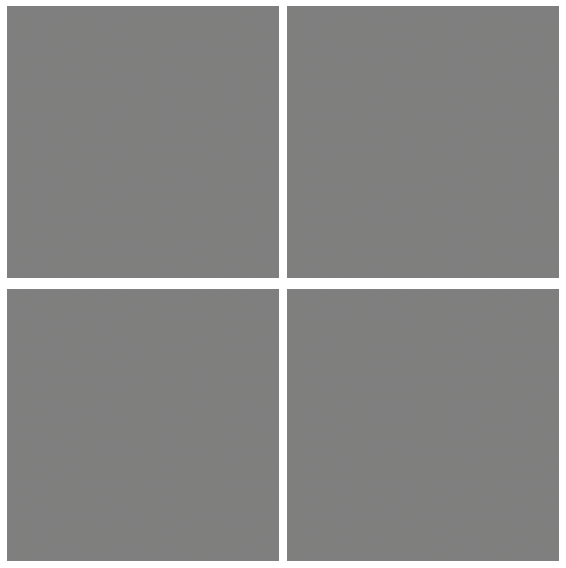

In [27]:
# after seeing one epoch was about 40 seconds, i am starting to train with many more.  first, we will peek at the outputs though.  we need a functions for that:

def generate_and_plot_images(generator, num_images=16, z_dim=100):
    # Generate random noise as input for the generator
    noise = tf.random.normal([num_images, z_dim])
    # Generate images from the noise
    generated_images = generator(noise, training=False)
    
    fig = plt.figure(figsize=(8, 8))
    
    for i in range(generated_images.shape[0]):
        plt.subplot(2, 2, i+1)
        plt.imshow((generated_images[i, :, :, :] + 1) / 2)  # Rescale pixel values from [-1, 1] to [0, 1]
        plt.axis('off')
        
    plt.tight_layout()
    plt.show()

generate_and_plot_images(generator, num_images=4)

So far, we can see the images are basically blank.  Now, back to the training!

In [28]:
epochs = 10
batch_size = 32

train(normalized_image_ds.batch(batch_size), epochs)

c:\Users\Fanta\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\backend.py:5818: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


## Iterative Trainings
Our images look a bit different now.  We'll keep training.  We will keep doing training iterations until we get a good result.

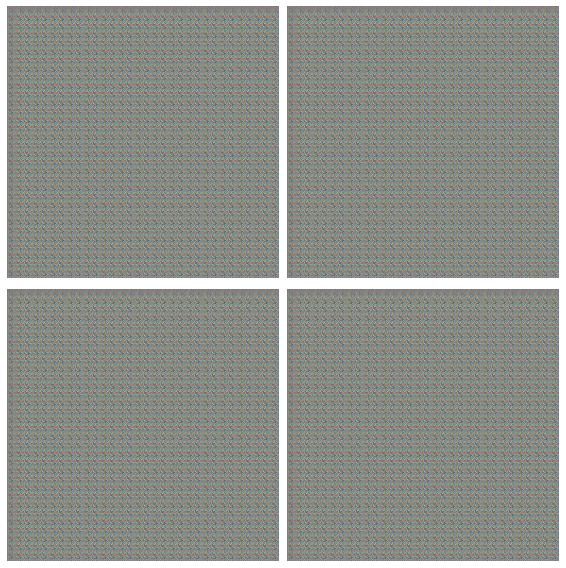

In [29]:
generate_and_plot_images(generator, num_images=4)

In [30]:
epochs = 10
batch_size = 32

train(normalized_image_ds.batch(batch_size), epochs)

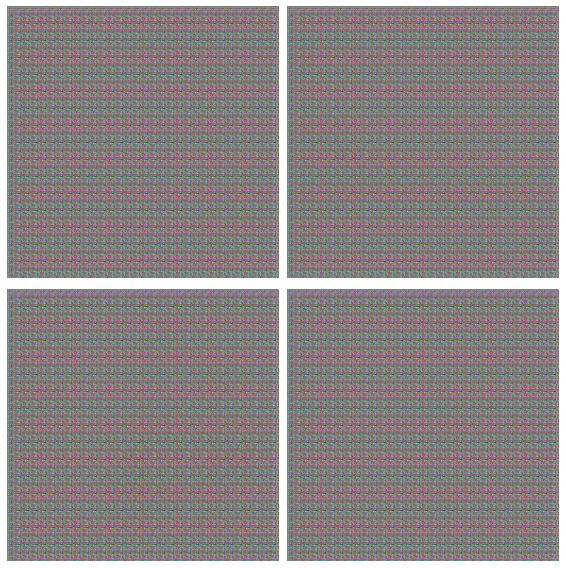

In [31]:
generate_and_plot_images(generator, num_images=4)

## Issue with generation
At this point I am noticing that the image is being output as identical each time.  Lets fix that:

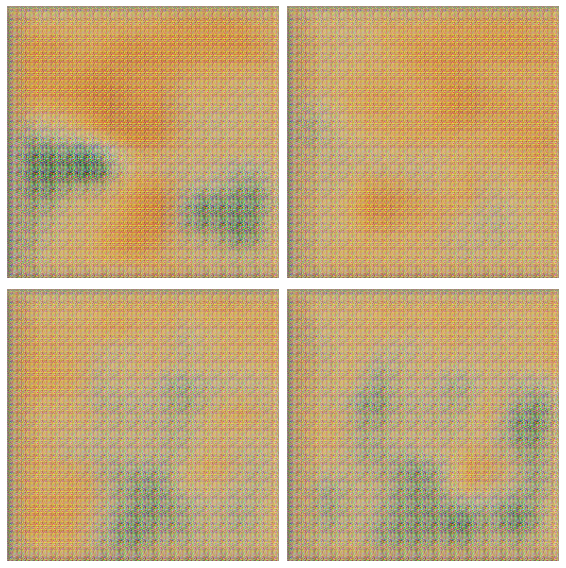

In [67]:
def generate_and_plot_images(generator, num_images=16, z_dim=100):
    noise = tf.random.normal([num_images, z_dim])
    generated_images = generator(noise, training=False).numpy()  # Convert to NumPy array for plotting

    fig = plt.figure(figsize=(8, 8))

    cols = int(num_images**0.5)
    rows = num_images // cols + int(num_images % cols != 0)

    for i in range(num_images):
        plt.subplot(rows, cols, i+1)
        # Rescale pixel values from [-1, 1] to [0, 1] and plot
        plt.imshow((generated_images[i] + 1) / 2)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

generate_and_plot_images(generator, num_images=4)

We will do a longer training session this time.

In [34]:
epochs = 30
batch_size = 32

train(normalized_image_ds.batch(batch_size), epochs)

c:\Users\Fanta\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\backend.py:5818: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


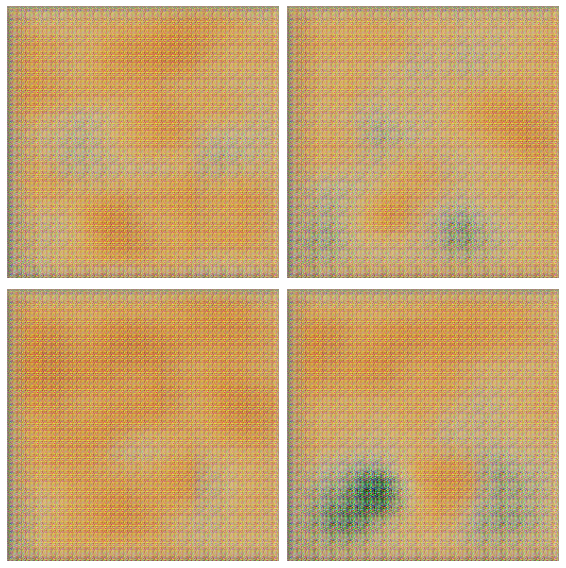

In [35]:
generate_and_plot_images(generator, num_images=4)

This is a bit more coherant.

## An issue in the model
At this point, I thought the outputs being repetitive noise were odd.  I also noticed this warning:
UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(

This is because my discriminator had a minor flaw in the activation function.  To fix this, I changed the binary_crossentropy to from_logits=False, and started training over.

In [36]:
# Redefine models.
discriminator_2 = build_discriminator()
generator_2 = build_generator(z_dim = Z_DIM)

# Define loss and optimizers
cross_entropy_2 = tf.keras.losses.BinaryCrossentropy(from_logits=False)
generator_optimizer_2 = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer_2 = tf.keras.optimizers.Adam(1e-4)

def train_step(real_images):
    noise = tf.random.normal([batch_size, Z_DIM])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator_2(noise, training=True)

        # discriminator output for real and fake images
        real_output = discriminator_2(real_images, training=True)
        fake_output = discriminator_2(generated_images, training=True)

        # calculating loss
        gen_loss = cross_entropy_2(tf.ones_like(fake_output), fake_output)
        disc_loss = cross_entropy_2(tf.ones_like(real_output), real_output) + \
                    cross_entropy_2(tf.zeros_like(fake_output), fake_output)

    # update gradients
    gradients_of_generator = gen_tape.gradient(gen_loss, generator_2.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator_2.trainable_variables)

    # apply gradients
    generator_optimizer_2.apply_gradients(zip(gradients_of_generator, generator_2.trainable_variables))
    discriminator_optimizer_2.apply_gradients(zip(gradients_of_discriminator, discriminator_2.trainable_variables))

# full training loop
def train(dataset, epochs):
    for epoch in range(epochs):
        for image_batch in dataset:
            train_step(image_batch)

## Training Process Take 2
Now we will iteratively train again.

In [37]:
epochs = 1
batch_size = 32

train(normalized_image_ds.batch(batch_size), epochs)

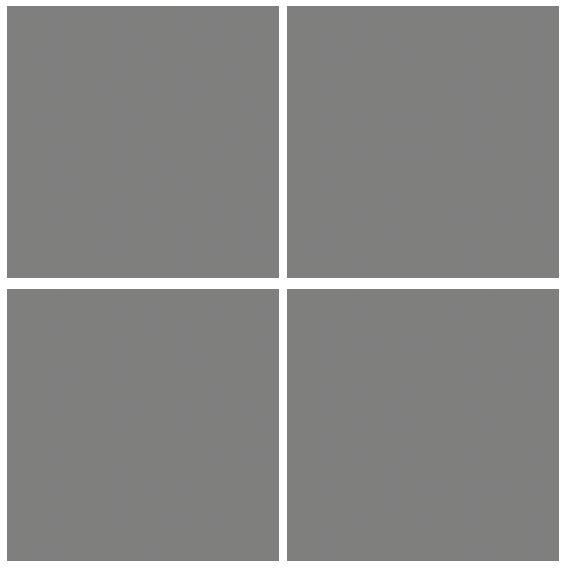

In [39]:
generate_and_plot_images(generator_2, num_images=4)

In [40]:
epochs = 10
batch_size = 32

train(normalized_image_ds.batch(batch_size), epochs)

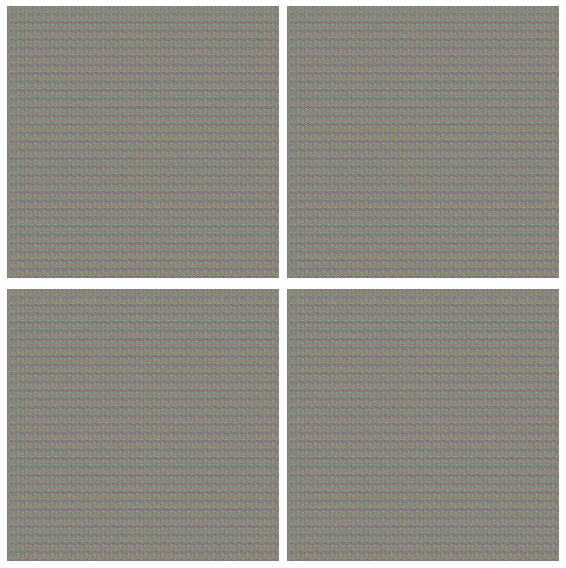

In [41]:
generate_and_plot_images(generator_2, num_images=4)

It looks like the issue may not have mattered, and we just need to train a lot more.  Now we will do a massive 50 epochs.

In [42]:
epochs = 50
batch_size = 32

train(normalized_image_ds.batch(batch_size), epochs)

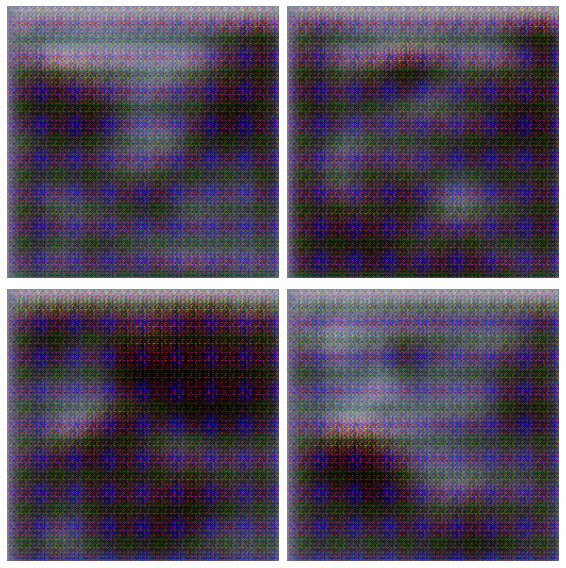

In [43]:
generate_and_plot_images(generator_2, num_images=4)

We are starting to get somewhere.  Let's save and keep going!

In [44]:
discriminator_2.save('checkpoints/discriminator_61_epoch')
generator_2.save('checkpoints/generator_61_epoch')

INFO:tensorflow:Assets written to: checkpoints/discriminator_61_epoch\assets


INFO:tensorflow:Assets written to: checkpoints/discriminator_61_epoch\assets


INFO:tensorflow:Assets written to: checkpoints/generator_61_epoch\assets


INFO:tensorflow:Assets written to: checkpoints/generator_61_epoch\assets


In [45]:
epochs = 49
batch_size = 32

train(normalized_image_ds.batch(batch_size), epochs)

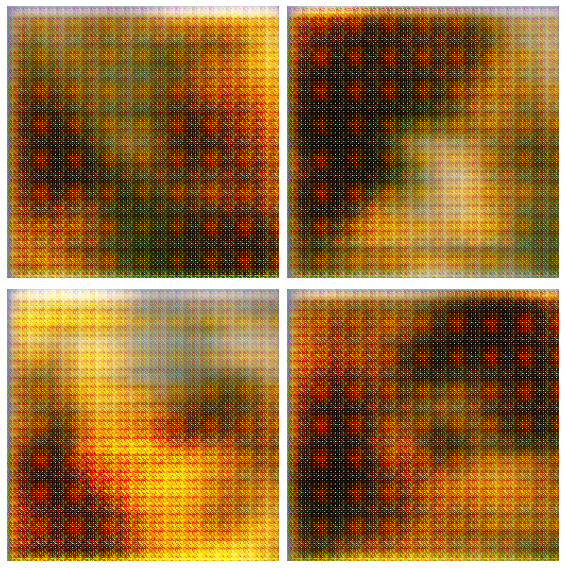

In [46]:
generate_and_plot_images(generator_2, num_images=4)

Not much different, we will go ahead and save again and then run for another 100 epochs and call the result good.  There may be model issues, or other problems.

We may also be able to salvage performance by providing base images as reference.

In [47]:
discriminator_2.save('checkpoints/discriminator_100_epoch')
generator_2.save('checkpoints/generator_100_epoch')

INFO:tensorflow:Assets written to: checkpoints/discriminator_100_epoch\assets


INFO:tensorflow:Assets written to: checkpoints/discriminator_100_epoch\assets


INFO:tensorflow:Assets written to: checkpoints/generator_100_epoch\assets


INFO:tensorflow:Assets written to: checkpoints/generator_100_epoch\assets


In [48]:
epochs = 100
batch_size = 32

train(normalized_image_ds.batch(batch_size), epochs)

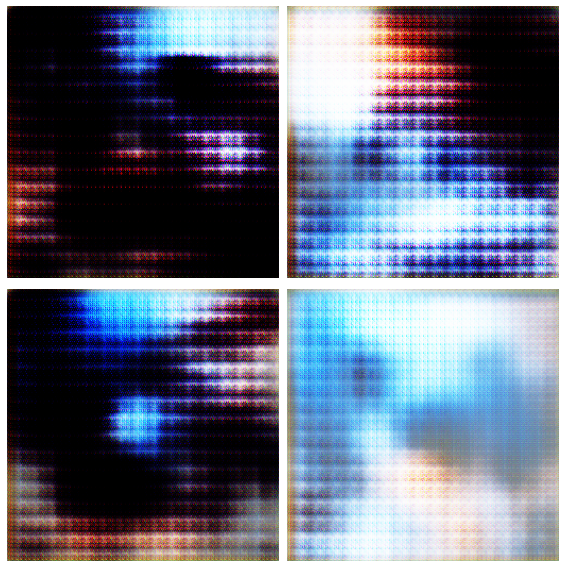

In [49]:
generate_and_plot_images(generator_2, num_images=4)

In [50]:
discriminator_2.save('checkpoints/discriminator_200_epoch')
generator_2.save('checkpoints/generator_200_epoch')

INFO:tensorflow:Assets written to: checkpoints/discriminator_200_epoch\assets


INFO:tensorflow:Assets written to: checkpoints/discriminator_200_epoch\assets


INFO:tensorflow:Assets written to: checkpoints/generator_200_epoch\assets


INFO:tensorflow:Assets written to: checkpoints/generator_200_epoch\assets


## Getting Output
We need images to submit to Kaggle.  I have modified the generation function to be more flexibile below.

In [73]:
def generate_and_plot_images(generator, num_images=16, z_dim=100, save_images=False, save_dir='generated_images'):
    noise = tf.random.normal([num_images, z_dim])
    generated_images = generator(noise, training=False).numpy()

    if save_images:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)

        for i in range(num_images):
            img = (generated_images[i] + 1) / 2
            plt.imsave(os.path.join(save_dir, f'image_{i+1}.png'), img)
    else:
        fig = plt.figure(figsize=(8, 8))

        cols = int(num_images**0.5)
        rows = num_images // cols + int(num_images % cols != 0)

        for i in range(num_images):
            plt.subplot(rows, cols, i+1)
            plt.imshow((generated_images[i] + 1) / 2)
            plt.axis('off')

        plt.tight_layout()
        plt.show()

In [72]:
generate_and_plot_images(generator_2, num_images=500, save_images=True)

In [80]:
# Make 10000 total for the 10000 submission.
for i in range(21):
    generate_and_plot_images(generator_2, num_images=500, save_images=True, save_dir=f'generated_images_{i}')

# Conclusion
I was able to successfully generate images with a DCGAN, but they weren't very good.  They sort of feel like they are on the right track, but they are too blurry.  I suspect this is an issue with the model not being detailed enough.